In [5]:
import object_reconstruction.data.checkpoints as checkpoints
import object_reconstruction.data.obj_pointcloud as obj_pointcloud
import numpy as np
import torch
import plotly.graph_objects as go
import os
import object_reconstruction.utils.mesh_utils as mesh_utils

In this notebook, I analyse the data collected in `checkpoints/debug_rotation`: <br>

`debug_rotation_{timestamp}.npy` is a dictionary with the following keys:
- `obj_index`: object index, e.g. 101273.
- `filtered_full_pointcloud`: pointcloud collected from PyBullet. This has non-fixed size.The non-contact points are filtered out.
- `pointcloud_wrk`: pointcloud after mesh processing. This has fixed size (1, 2000, 3).
- `pos_wrk`: position of the sensor in world frame collected from PyBullet.
- `pos_wrld`: position of the sensor in world coordinates at touch, collected from PyBullet (robots.coords_at_touch)
- `rot_M`: 3x3 rotation matrix collected from PyBullet.
- `rot_Q`: quaternions collected from PyBullet.
- `initial_pos`: initial position of the object

Let's load these files:

In [103]:
timestamp = '26_09_1731'
dict_rotation_path = os.path.join(os.path.dirname(checkpoints.__file__), 'debug_rotation', f'debug_rotation_{timestamp}.npy')
dict_rotation = np.load(dict_rotation_path, allow_pickle=True).item()

First of all, I plot all the pointclouds in the same plot.

In [104]:
obj_index = list(dict_rotation.keys())[0]
dict_obj = dict_rotation[obj_index]

# ground truth object pointcloud
pointcloud_gt_path = os.path.join(os.path.dirname(obj_pointcloud.__file__), obj_index, 'obj_pointcloud.npy')
pointcloud_gt = np.load(pointcloud_gt_path, allow_pickle=True)

list_figures = [
    go.Scatter3d(x=dict_obj['filtered_full_pointcloud'][i][:,0] - np.array(dict_obj['initial_pos'][i][0]), 
                 y=dict_obj['filtered_full_pointcloud'][i][:,1] - np.array(dict_obj['initial_pos'][i][1]), 
                 z=dict_obj['filtered_full_pointcloud'][i][:,2] - np.array(dict_obj['initial_pos'][i][2]), 
                 mode='markers', marker=dict(size = 1, color='orange')) for i in range(len(dict_obj['filtered_full_pointcloud']))
]
list_figures.append(
    go.Scatter3d(x=pointcloud_gt[:,0], 
                 y=pointcloud_gt[:,1],
                 z=pointcloud_gt[:,2],
                 mode='markers', marker=dict(size = 1))
)
    
fig = go.Figure(list_figures)
fig.show()

In [61]:
dict_obj['pos_wrld'][0]

array([0.66575251, 0.04366679, 0.05175209])

In [63]:
pos_wrld = dict_obj['pos_wrld'][0]
rot_M = dict_obj['rot_M_wrld'][0]
pointcloud_wrk = dict_obj['pointcloud_wrk'][0]
initial_pos = dict_obj['initial_pos'][0]

pointcloud_wrld = mesh_utils.translate_rotate_mesh(pos_wrld, rot_M, pointcloud_wrk, initial_pos)
fig = go.Figure([
    go.Scatter3d(x=filtered_full_pointcloud[:,0], y=filtered_full_pointcloud[:,1], z=filtered_full_pointcloud[:,2], mode='markers', marker=dict(size = 1)),
    go.Scatter3d(x=pointcloud_wrld[0,:,0], y=pointcloud_wrld[0,:,1], z=pointcloud_wrld[0,:,2], mode='markers', marker=dict(size = 1))
])
fig.show()

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

# Analyse the Dataset that stores rotated tensors
The first 5 elements in the dataset were collected from the object that has index 102763.

In [ ]:
import object_reconstruction.data.checkpoints as checkpoints
import torch
import object_reconstruction.data.obj_pointcloud as obj_pointcloud
import pybullet as pb

In [ ]:
debug_path = os.path.join(os.path.dirname(checkpoints.__file__), 'debug_rotation', 'dataset.npy')
dataset = np.load(debug_path, allow_pickle=True)

In [ ]:
x_list = np.array([]).reshape(0, 2000)
y_list = np.array([]).reshape(0, 2000)
z_list = np.array([]).reshape(0, 2000)

for i in range(5):
    x_list = np.vstack((x_list, dataset[i][1].numpy()[:, 0]))
    y_list = np.vstack((y_list, dataset[i][1].numpy()[:, 1]))
    z_list = np.vstack((z_list, dataset[i][1].numpy()[:, 2]))
    
fig = go.Figure([
    go.Scatter3d(x=x_list.ravel(), y=y_list.ravel(), z=z_list.ravel(), mode='markers', marker=dict(size = 1))
])
fig.show()   

Add now the visualisation of the object as well. Let's remind that the object from which these touch charts were collected is 102763.

In [ ]:
# Load object
obj_path = os.path.join(os.path.dirname(obj_pointcloud.__file__), '102763', 'obj_pointcloud.npy')
obj = np.load(obj_path, allow_pickle=True)

# Scale object
scale_obj = 0.1
obj = obj * scale_obj

# Rotate object
rot_Q = pb.getQuaternionFromEuler([-np.pi/2, -np.pi/2, 0])
rot_M = np.array(pb.getMatrixFromQuaternion(rot_Q)).reshape(3, 3)
print(rot_M.shape, obj.shape)

obj = np.einsum('ij,ki->kj', rot_M, obj)

# Move object
obj = obj + [0.65, 0.0, 0.025]

fig = go.Figure([
    go.Scatter3d(x=obj[:, 0], y=obj[:, 1], z=obj[:, 2], mode='markers', marker=dict(size = 1)),
    go.Scatter3d(x=x_list.ravel(), y=y_list.ravel(), z=z_list.ravel(), mode='markers', marker=dict(size = 1))
])
fig.show()  

# Analyse rotation from `touch_charts_gt.npy`


In [105]:
import object_reconstruction.data.checkpoints as checkpoints
import object_reconstruction.data.obj_pointcloud as obj_pointcloud
import numpy as np
import torch
import plotly.graph_objects as go
import os
import object_reconstruction.utils.mesh_utils as mesh_utils
import object_reconstruction.data.touch_charts as touch_charts
import matplotlib.pyplot as plt
import matplotlib as mpl
import pybullet as pb
plt.style.use('default')
%matplotlib widget

In this notebook, I analyse the data collected in `checkpoints/debug_rotation`:
- `'verts'`: shape (n_samples, 75), ground truth vertices for various samples
- `'faces'`: shape (n_faces, 3), concatenated triangles. The number of faces per sample varies, so it is not possible to store faces per sample.
- `'tactile_imgs'`: shape (n_samples, 1, 256, 256)
- `'pointclouds'`: shape (n_samples, 2000, 3), points randomly samples on the touch charts mesh surface.
- `'rot_M_wrld'`: 3x3 rotation matrix collected from PyBullet.
- `'pos_wrld'`: position of the sensor in world coordinates at touch, collected from PyBullet (robots.coords_at_touch)
- `'pos_wrk'`: position of the sensor in world frame collected from PyBullet.

Let's load this file:

In [144]:
obj_index = '102408'
touch_charts_dict = np.load(os.path.join(os.path.dirname(touch_charts.__file__), obj_index, 'touch_charts_gt.npy'), allow_pickle=True).item()

Touch chart pointclouds and object point cloud:

In [145]:
pos_wrk = touch_charts_dict['pointclouds'].reshape(
    touch_charts_dict['pointclouds'].shape[0] * touch_charts_dict['pointclouds'].shape[1], -1
)
pos_wrld = touch_charts_dict['pos_wrld'] - touch_charts_dict['initial_pos']
fig = go.Figure([
    go.Scatter3d(x=obj[:, 0], y=obj[:, 1], z=obj[:, 2], mode='markers', marker=dict(size = 1)),
    go.Scatter3d(x=pos_wrld[:, 0], y=pos_wrld[:, 1], z=pos_wrld[:, 2], mode='markers', marker=dict(size = 1)),
    go.Scatter3d(x=pos_wrk[:, 0], y=pos_wrk[:, 1], z=pos_wrk[:, 2], mode='markers', marker=dict(size = 1))
    
])
fig.show()

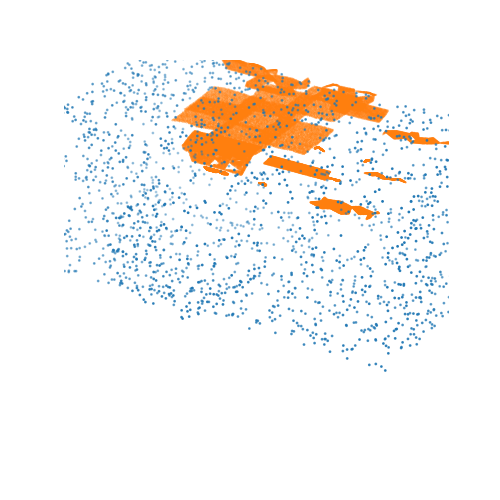

In [146]:
pointcloud_wrld = mesh_utils.translate_rotate_mesh(touch_charts_dict['pos_wrld'], touch_charts_dict['rot_M_wrld'], touch_charts_dict['pointclouds'], touch_charts_dict['initial_pos'])  # shape (n, 2000, 3)
pointcloud_wrld_plot = pointcloud_wrld.reshape(pointcloud_wrld.shape[0] * pointcloud_wrld.shape[1], pointcloud_wrld.shape[2])

# Load object
obj_path = os.path.join(os.path.dirname(obj_pointcloud.__file__), obj_index, 'obj_pointcloud.npy')
obj = np.load(obj_path, allow_pickle=True)

fig = go.Figure([
    go.Scatter3d(x=obj[:, 0], y=obj[:, 1], z=obj[:, 2], mode='markers', marker=dict(size = 1)),
    go.Scatter3d(x=pointcloud_wrld_plot[:, 0], y=pointcloud_wrld_plot[:, 1], z=pointcloud_wrld_plot[:, 2], mode='markers', marker=dict(size = 1))
])
#fig.update_yaxes(visible=False, showticklabels=False)
#fig.update_layout(yaxis={'visible': False, 'showticklabels': False})

fig.show() 

# Plot matplotlib
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection="3d")
# Create plots
x_obj = obj[:, 0]
y_obj = obj[:, 1]
z_obj = obj[:, 2]
x_touch = pointcloud_wrld_plot[:, 0]
y_touch = pointcloud_wrld_plot[:, 1]
z_touch = pointcloud_wrld_plot[:, 2]
ax.set_xlim(-0.05, 0.05)
ax.set_ylim(-0.05, 0.05)
ax.set_zlim(-0.07, 0.02)
scatters = ax.scatter(x_obj, y_obj, z_obj, s=1)
scatters = ax.scatter(x_touch, y_touch, z_touch, s=0.1)
plt.axis('off')
plt.grid(visible=None)
plt.show()